<a href="https://colab.research.google.com/github/SoundaryaaSitaram/Clean-Campus-AI-based-trash-throwing-detection-system/blob/main/trash_throwing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

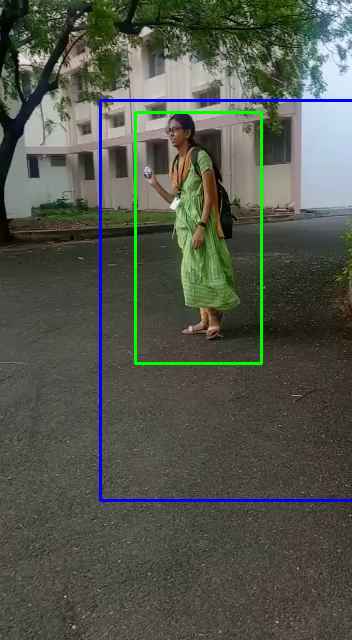

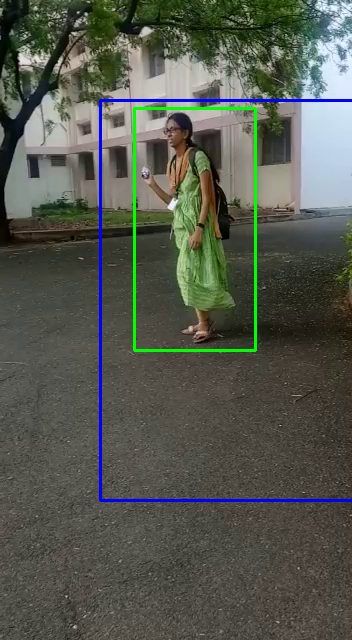

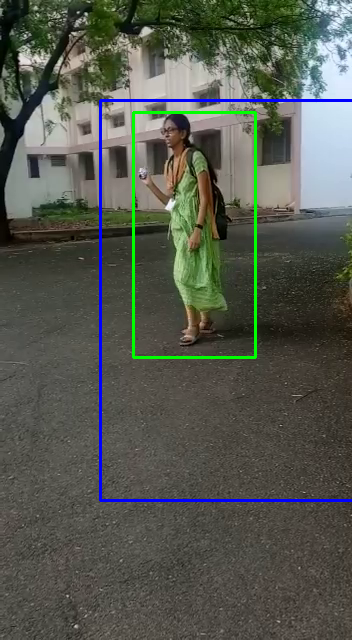

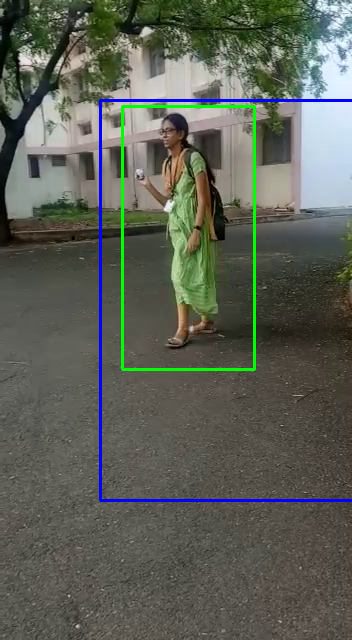

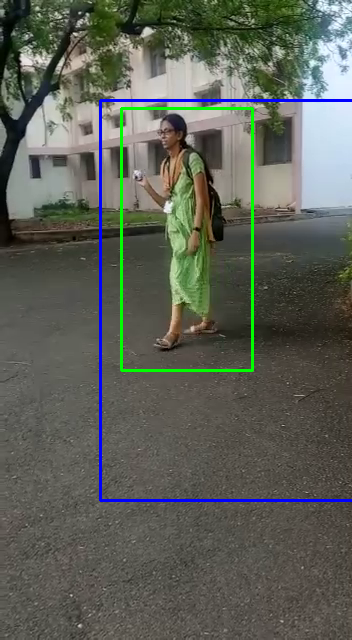

...

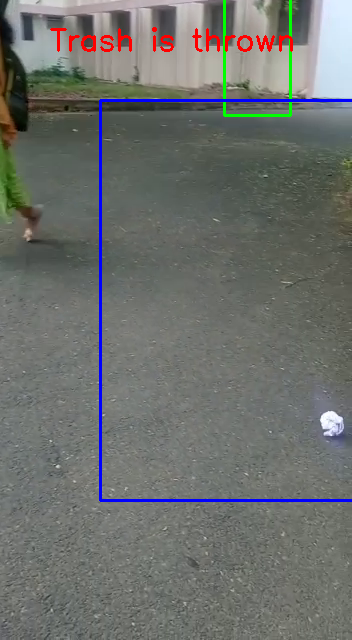

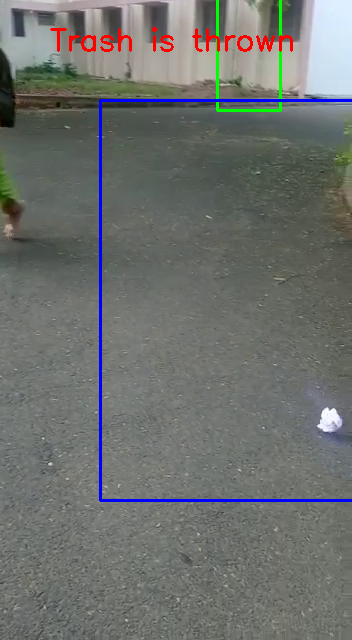

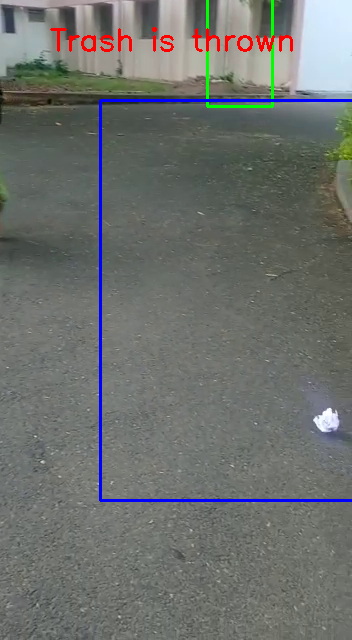

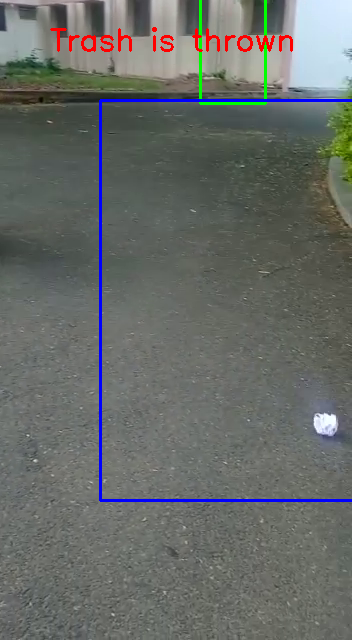

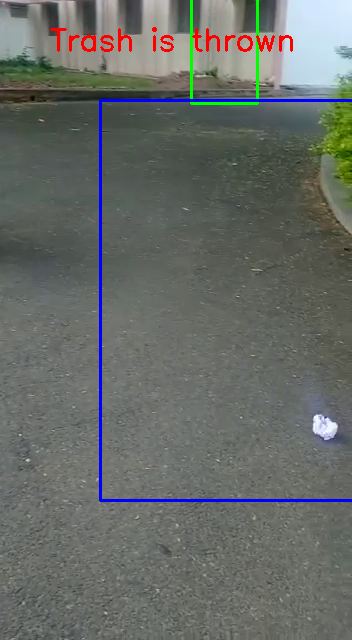

Accuracy: 42.11%


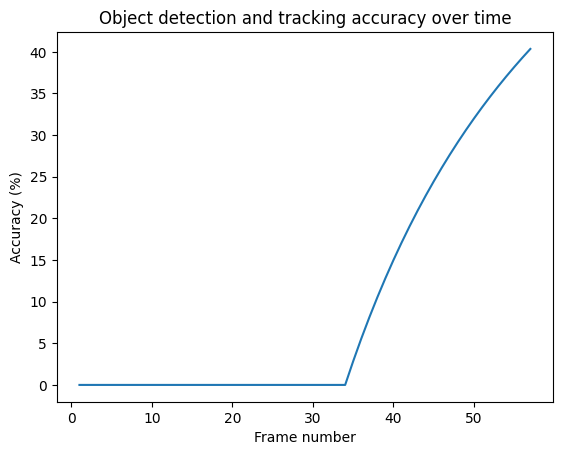

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Initialize lists to store the accuracy and frame number
accuracy_list = []
frame_list = []

# Load the video file
cap = cv2.VideoCapture('/content/drive/MyDrive/data/validation/throwing_trash/v6.mp4')

# Create the HOG detector
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

# Create the CSRT tracker
tracker = cv2.TrackerCSRT_create()

# Define the boundary of the human
boundary = (100, 100, 400, 400)

# Set the threshold for the number of frames the object needs to be outside the human's boundary before displaying the message
threshold = 10
count = 0
total_frames = 0
detected_frames = 0

# Loop through the video frames
while True:
    ret, frame = cap.read()
    if not ret:
        break

    total_frames += 1


    # Convert the frame to grayscale for HOG detection
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect humans using the HOG detector
    human_rects, _ = hog.detectMultiScale(gray)

    # Initialize the tracker with human detected
    max_area = 0
    max_rect = None
    for rect in human_rects:
        area = rect[2] * rect[3]
        if area > max_area:
            max_area = area
            max_rect = rect

    if max_rect is not None:
        tracker.init(frame, tuple(max_rect))

    # Update the tracker and draw the bounding box around the tracked object
    success, bbox = tracker.update(frame)
    accuracy = detected_frames / total_frames * 100
    accuracy_list.append(accuracy)
    frame_list.append(total_frames)
    if success:
        x, y, w, h = [int(v) for v in bbox]
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2)

        # Check if the object is outside the human's boundary for a certain number of frames
        if x < boundary[0] or y < boundary[1] or x+w > boundary[0]+boundary[2] or y+h > boundary[1]+boundary[3]:
            count += 1
            if count > threshold:
                # Display the message "trash is thrown"
                cv2.putText(frame, 'Trash is thrown', (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
                detected_frames += 1
        else:
            count = 0

    # Draw the boundary of the human
    cv2.rectangle(frame, (boundary[0], boundary[1]), (boundary[0]+boundary[2], boundary[1]+boundary[3]), (255, 0, 0), 2)

    # Display the frame
    cv2_imshow(frame)
    if cv2.waitKey(1) == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

# Calculate and print the accuracy
accuracy = detected_frames / total_frames * 100
print(f'Accuracy: {accuracy:.2f}%')
plt.plot(frame_list, accuracy_list)
plt.xlabel('Frame number')
plt.ylabel('Accuracy (%)')
plt.title('Object detection and tracking accuracy over time')
plt.show()

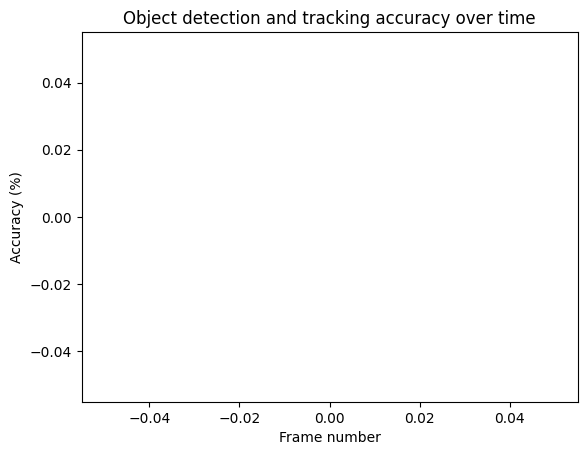

In [ ]:
import matplotlib.pyplot as plt

# Initialize lists to store the accuracy and frame number
accuracy_list = []
frame_list = []

# Loop through the video frames
while True:
    ret, frame = cap.read()
    if not ret:
        break

    total_frames += 1

    # ... rest of the code ...

    # Calculate and append the accuracy for each frame
    accuracy = detected_frames / total_frames * 100
    accuracy_list.append(accuracy)
    frame_list.append(total_frames)

# Plot the accuracy over time
plt.plot(frame_list, accuracy_list)
plt.xlabel('Frame number')
plt.ylabel('Accuracy (%)')
plt.title('Object detection and tracking accuracy over time')
plt.show()
